<h1> Intelligent System Project


In [ ]:
#test the nvidia cuda version
!nvidia-smi

Mon Apr 17 19:36:54 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

<h1>Importing Library


In [ ]:
# import os
# import shutil
# import numpy as np
# import matplotlib.pyplot as plt
# import tensorflow as tf
# from keras.preprocessing import image
# from keras.preprocessing.image import ImageDataGenerator
# from keras.models import Sequential, load_model
# from keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D, BatchNormalization
# from sklearn.metrics import confusion_matrix, classification_report
# from keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

np.random.seed(42)

<h1>Preprocessing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#current file directory
zip_file_folder_directory= "/content/drive/MyDrive/IJS"
zip_file_directory = "fall_dataset.zip"

dataset_images_folder_train = "/content/drive/MyDrive/IJS/fall_dataset/images/train" #374
dataset_images_folder_val = "/content/drive/MyDrive/IJS/fall_dataset/images/val" #111
dataset_images_folder_test = "/content/drive/MyDrive/IJS/fall_dataset/images/test"

dataset_labels_folder_train = "/content/drive/MyDrive/IJS/fall_dataset/labels/train" #374
dataset_labels_folder_val = "/content/drive/MyDrive/IJS/fall_dataset/labels/val" #111
dataset_labels_folder_test = "/content/drive/MyDrive/IJS/fall_dataset/labels/test"

dataset_images_folder_train_fall = "/content/drive/MyDrive/IJS/fall_dataset/images/train/fall" #208
dataset_images_folder_train_not_fallen = "/content/drive/MyDrive/IJS/fall_dataset/images/train/not_fallen" #166

dataset_images_folder_val_fall = "/content/drive/MyDrive/IJS/fall_dataset/images/val/fall" #208
dataset_images_folder_val_not_fallen = "/content/drive/MyDrive/IJS/fall_dataset/images/val/not_fallen" #166

dataset_labels_folder_val_fall = "/content/drive/MyDrive/IJS/fall_dataset/labels/val/fall" #111
dataset_labels_folder_val_not_fall = "/content/drive/MyDrive/IJS/fall_dataset/labels/val/not_fallen" #111

dataset_labels_folder_train_not_fall = "/content/drive/MyDrive/IJS/fall_dataset/labels/train/not_fallen" #111



In [ ]:
#go to folder of dataset
import os 
os.chdir(zip_file_folder_directory)
os.getcwd()

'/content/drive/MyDrive/IJS'

In [ ]:
# #extract zipfile content
# from zipfile import ZipFile
  
# # loading the temp.zip and creating a zip object
# with ZipFile(zip_file_directory) as zObject:
#     zObject.extractall(path=zip_file_folder_directory)

In [ ]:
#check number of files in each folder
print(len(os.listdir("/content/drive/MyDrive/IJS/data/images/train")))
print(len(os.listdir("/content/drive/MyDrive/IJS/data/images/val")))
print(len(os.listdir("/content/drive/MyDrive/IJS/data/images/test")))

#label files
print(len(os.listdir("/content/drive/MyDrive/IJS/data/labels/train")))
print(len(os.listdir("/content/drive/MyDrive/IJS/data/labels/val")))
print(len(os.listdir("/content/drive/MyDrive/IJS/data/labels/test")))
# print(len(os.listdir(dataset_images_folder_test)))

# print(len(os.listdir(dataset_labels_folder_train)))
# print(len(os.listdir(dataset_labels_folder_val)))
# # print(len(os.listdir(dataset_images_folder_train)))

# print(len(os.listdir(dataset_images_folder_train_fall)))
# print(len(os.listdir(dataset_images_folder_train_not_fallen)))

374
111
50
374
112
50


In [ ]:
# #make new folders in train for classes
# os.mkdir(dataset_labels_folder_train + "/fall")
# os.mkdir(dataset_labels_folder_train + "/not_fallen")

In [ ]:
# #get list of file names in folder

# import os
# train_fall_list_of_files = os.listdir("/content/drive/MyDrive/IJS/fall_dataset/labels/val")

# # train_fall_list_of_files.remove("fall")
# # train_fall_list_of_files.remove("not_fallen")

# print(train_fall_list_of_files)
# print(len(train_fall_list_of_files))

In [ ]:
# #move the images to proper folder structure

# import shutil
# for item in train_fall_list_of_files:
#   if "fall"  in item:
#     print(shutil.move("/content/drive/MyDrive/IJS/fall_dataset/labels/val/not_fallen" + "/" + item,"/content/drive/MyDrive/IJS/fall_dataset/labels/val" + "/" + item))

In [ ]:
# images = os.listdir(dataset_labels_folder_train_not_fall) 
# print(images)
# for image in images:
#   x = image.split("not fallen")
#   os.rename("/content/drive/MyDrive/IJS/fall_dataset/labels/train/not_fallen/"+image,"not_fallen"+x[1])
  
    
    

<h3>Hyperparamenters

In [ ]:
TRAIN = True 
# Number of epochs to train for.
EPOCHS = 32

<h3> Visualise ground truth

In [ ]:
#assign colours to each class
class_names = ['Fall','Walking','Sitting']
colors = np.random.uniform(0, 255, size=(len(class_names), 3))

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)
        width = xmax - xmin
        height = ymax - ymin
        
        class_name = class_names[int(labels[box_num])]
        
        cv2.rectangle(
            image, 
            (xmin, ymin), (xmax, ymax),
            color=colors[class_names.index(class_name)],
            thickness=2
        ) 

        font_scale = min(1,max(3,int(w/500)))
        font_thickness = min(2, max(10,int(w/50)))
        
        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        # Text width and height
        tw, th = cv2.getTextSize(
            class_name, 
            0, fontScale=font_scale, thickness=font_thickness
        )[0]
        p2 = p1[0] + tw, p1[1] + -th - 10
        cv2.rectangle(
            image, 
            p1, p2,
            color=colors[class_names.index(class_name)],
            thickness=-1,
        )
        cv2.putText(
            image, 
            class_name,
            (xmin+1, ymin-10),
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            (255, 255, 255),
            font_thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_training_images = glob.glob(image_paths)
    all_training_labels = glob.glob(label_paths)
    all_training_images.sort()
    all_training_labels.sort()
    
    num_images = len(all_training_images)
    
    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image = cv2.imread(all_training_images[j])
        with open(all_training_labels[j], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=0)
    plt.tight_layout()
    plt.show()

In [ ]:
os.chdir("/content/drive/MyDrive/IJS/data")
os.getcwd()

'/content/drive/MyDrive/IJS/data'

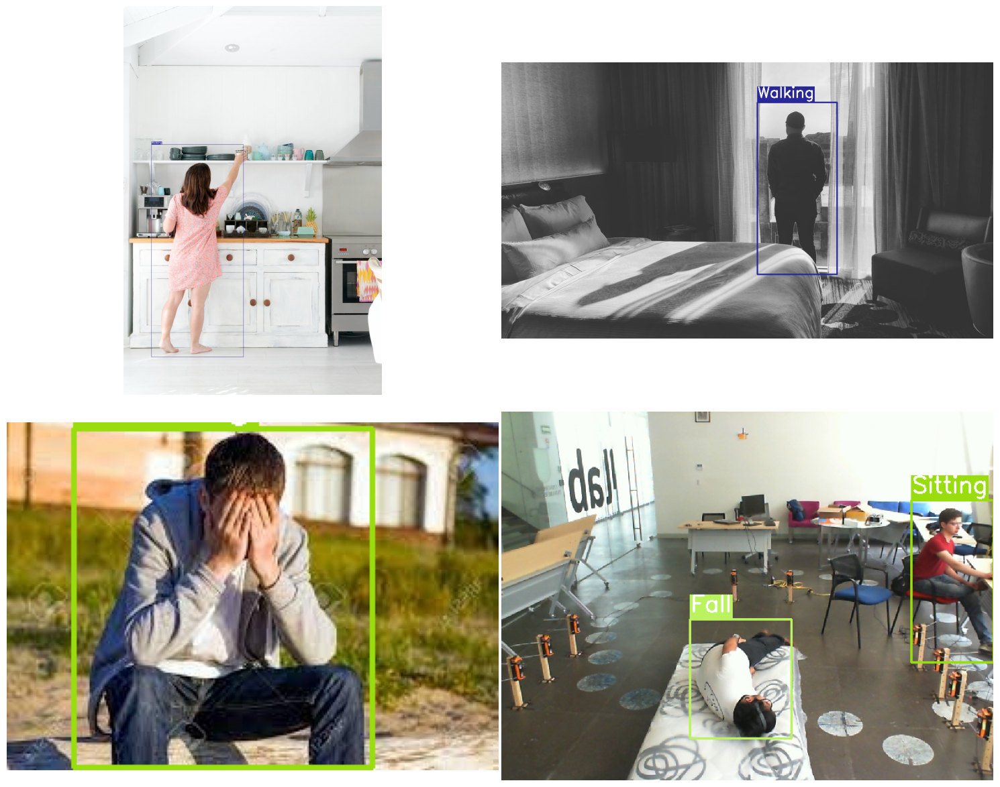

In [ ]:
# Visualize a few training images.
plot(
    image_paths='/content/drive/MyDrive/IJS/data/images/train/*', 
    label_paths='/content/drive/MyDrive/IJS/data/labels/train/*',
    num_samples=4,
)

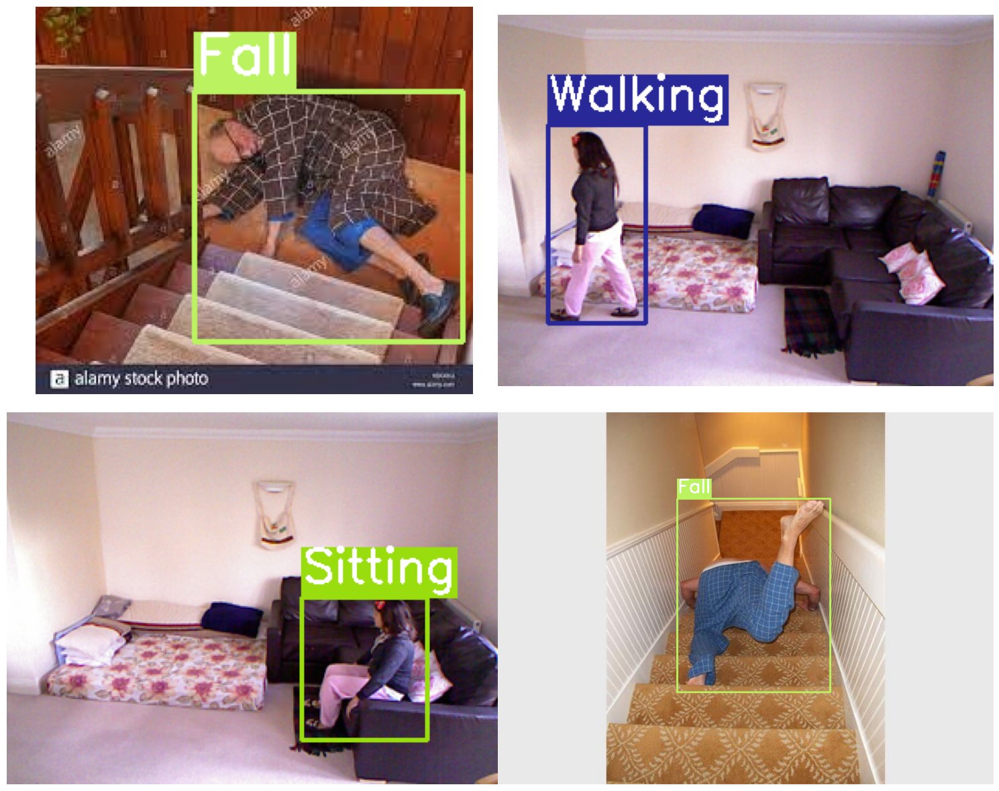

In [ ]:
# Visualize a few val images.
plot(
    image_paths='/content/drive/MyDrive/IJS/data/images/val/*', 
    label_paths='/content/drive/MyDrive/IJS/data/labels/val/*',
    num_samples=4,
)

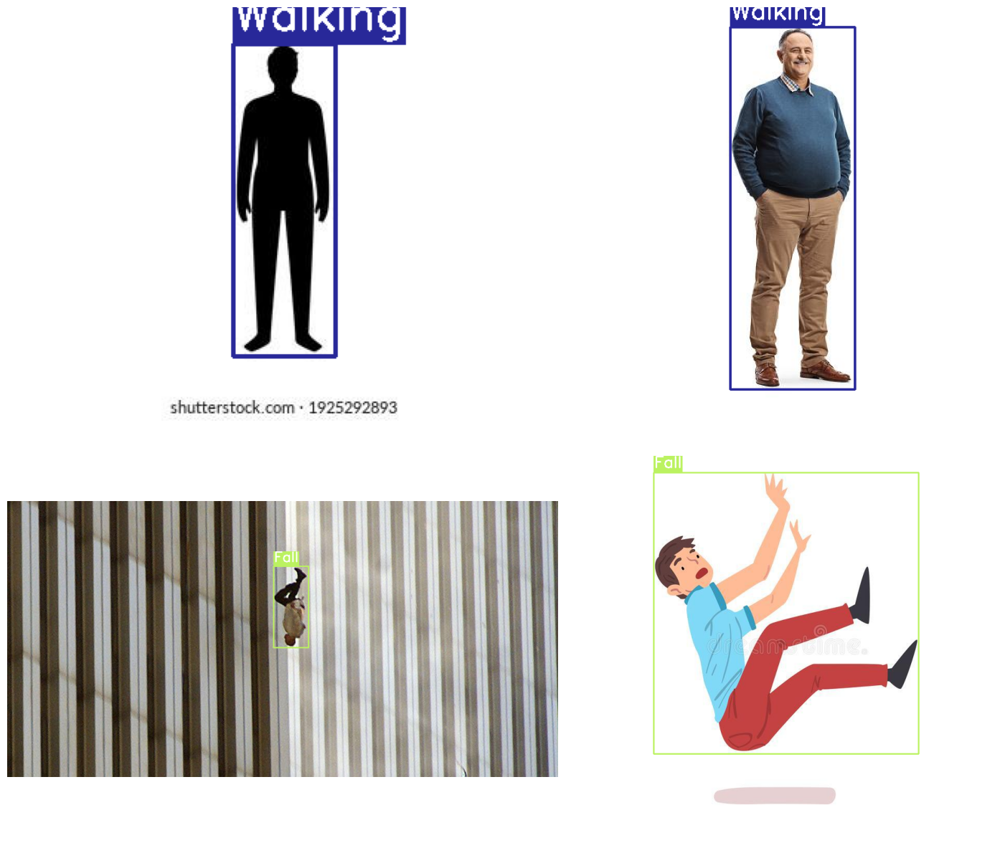

In [ ]:
# Visualize a few val images.
plot(
    image_paths='/content/drive/MyDrive/IJS/data/images/test/*', 
    label_paths='/content/drive/MyDrive/IJS/data/labels/test/*',
    num_samples=4,
)

<h3> Logging function

In [ ]:
def set_res_dir():
    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

<h3>Tensorboard logs

In [ ]:
def monitor_tensorboard():
    %load_ext tensorboard
    %tensorboard --logdir runs/train

<h3> CLone repository YOLOV5

In [ ]:
%cd /content/drive/MyDrive/IJS/data

/content


In [ ]:
if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git
    

Cloning into 'yolov5'...
remote: Enumerating objects: 15305, done.
remote: Total 15305 (delta 0), reused 0 (delta 0), pack-reused 15305
Receiving objects: 100% (15305/15305), 14.19 MiB | 10.30 MiB/s, done.
Resolving deltas: 100% (10500/10500), done.
Updating files: 100% (141/141), done.


In [ ]:
os.chdir("/content/drive/MyDrive/IJS/data")
os.getcwd()

'/content/drive/MyDrive/IJS/data'

In [ ]:
%cd /content/drive/MyDrive/IJS/data/yolov5
!pip install -r requirements.txt

/content/drive/MyDrive/IJS/data/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.1 MB/s eta 0:00:00


<h2>Training YOLOV5

In [ ]:
monitor_tensorboard()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2880), started 0:24:12 ago. (Use '!kill 2880' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
%cd /content/drive/MyDrive/IJS/data/yolov5/

/content/drive/MyDrive/IJS/data/yolov5


In [ ]:


testing_images = os.chdir("/content/drive/MyDrive/IJS/data/yolov5")

os.getcwd()

'/content/drive/MyDrive/IJS/data/yolov5'

In [ ]:
!rm -f data/train/labels.npy

In [ ]:
#get list of file names in folder

import os
train_fall_list_of_files = os.listdir("/content/drive/MyDrive/IJS/data/labels")

# train_fall_list_of_files.remove("fall")
# train_fall_list_of_files.remove("not_fallen")

print(train_fall_list_of_files)
print(len(train_fall_list_of_files))

['train', 'val', '.ipynb_checkpoints', 'test']
4


In [ ]:
with open('/content/drive/MyDrive/IJS/data/dataset.yaml') as f:
    lines = f.readlines()
    print(lines)

['#relative path to train.py script\n', 'path: "../content/drive/MyDrive/IJS/data/yolov5"\n', '\n', '#training images\n', 'train: /content/drive/MyDrive/IJS/data/images/train\n', '\n', '#validation images\n', 'val: /content/drive/MyDrive/IJS/data/images/val\n', '\n', '#test data images\n', 'test: /content/drive/MyDrive/IJS/data/images/test\n', '\n', '#number of classes\n', 'nc: 3\n', '\n', '#names of classes\n', "names: ['Fall','Walking','Sitting']"]


In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../dataset.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 32 --name {RES_DIR}

Current number of result directories: 12
results_13
2023-04-17 19:48:28.207530: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-17 19:48:29.141598: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=, data=../dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=32, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_13, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../dataset.yaml --weights yolov5s.pt \
    --img 640 --epochs {EPOCHS} --batch-size 64 --name {RES_DIR} \
    --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

Current number of result directories: 13
results_14
2023-04-17 20:07:05.837100: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-17 20:07:07.013203: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=, data=../dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=32, batch_size=64, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_14, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0, 1, 2, 3, 4, 5, 6, 7, 

In [ ]:
RES_DIR = set_res_dir()
if TRAIN:
    !python train.py --data ../dataset.yaml --weights runs/train/results_14/weights/best.pt \
    --img 640 --epochs {EPOCHS} --batch-size 240 --name {RES_DIR} \
    --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

Current number of result directories: 16
results_17
2023-04-17 20:29:12.664798: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-17 20:29:13.618316: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=runs/train/results_14/weights/best.pt, cfg=, data=../dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=32, batch_size=240, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=results_17, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, free

In [ ]:
# Function to show validation predictions saved during training.
def show_valid_results(RES_DIR):
    !ls runs/train/{RES_DIR}
    EXP_PATH = f"runs/train/{RES_DIR}"
    validation_pred_images = glob.glob(f"{EXP_PATH}/*_pred.jpg")
    print(validation_pred_images)
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

In [ ]:
# Helper function for inference on images.
def inference(RES_DIR, data_path):
    # Directory to store inference results.
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")
    INFER_DIR = f"inference_{infer_dir_count+1}"
    print(INFER_DIR)
    # Inference on images.
    !python detect.py --weights runs/train/{RES_DIR}/weights/best.pt \
    --source {data_path} --name {INFER_DIR}
    return INFER_DIR

In [ ]:
def visualize(INFER_DIR):
# Visualize inference images.
    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

confusion_matrix.png				     R_curve.png
events.out.tfevents.1681763356.0a407cc09f71.15509.0  results.csv
F1_curve.png					     results.png
hyp.yaml					     train_batch0.jpg
labels_correlogram.jpg				     train_batch1.jpg
labels.jpg					     train_batch2.jpg
opt.yaml					     val_batch0_labels.jpg
P_curve.png					     val_batch0_pred.jpg
PR_curve.png					     weights
['runs/train/results_17/val_batch0_pred.jpg']


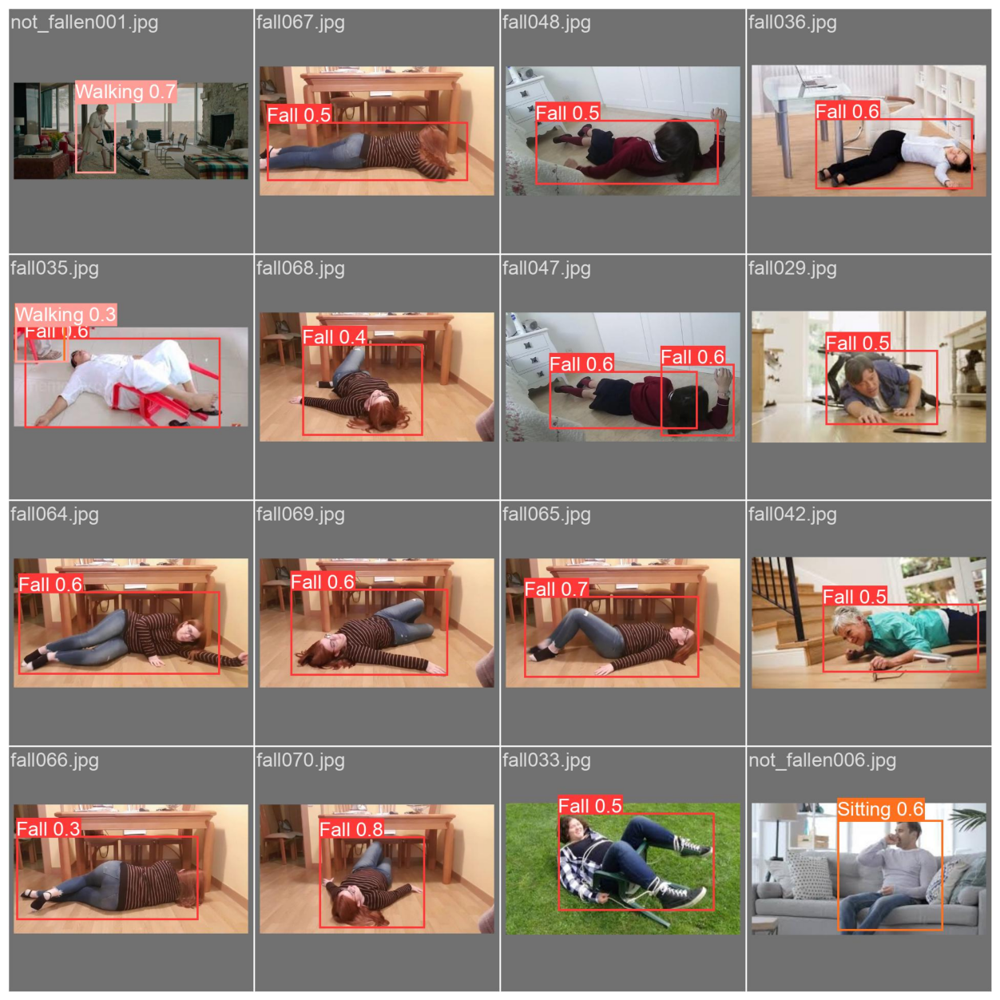

In [ ]:
show_valid_results(RES_DIR)

In [ ]:
from IPython.display import Image

!python detect.py --weights runs/train/results_13//weights/best.pt --img 640 --conf 0.25 --source testing_image/test2.jpg

detect: weights=['runs/train/results_13//weights/best.pt'], source=testing_image/test2.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-120-g3e55763 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/drive/MyDrive/IJS/data/yolov5/testing_image/test2.jpg: 448x640 1 Sitting, 71.9ms
Speed: 0.6ms pre-process, 71.9ms inference, 2.4ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp30


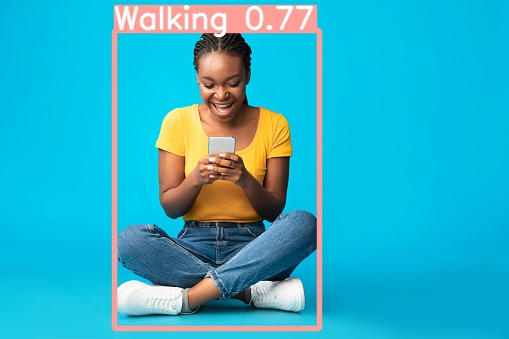

In [ ]:
Image(filename='/content/drive/MyDrive/IJS/data/yolov5/runs/detect/exp29/test2.jpg', width=600)